In [16]:
import numpy as np
import os 
import pandas as pd
#from pandas_profiling import ProfileReport
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn import ensemble, tree, linear_model
from sklearn import tree
from sklearn.metrics import accuracy_score
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer
from scipy.stats import pearsonr
import pyodbc
import seaborn as sns

import re
from scipy import stats
from scipy.stats import chisquare
from scipy.stats import chi2_contingency
from scipy.stats import f_oneway
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.stats import ks_2samp
from scipy.stats import norm
#import missingno as msno
import warnings
import datetime
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', None)
import nltk
#nltk.download('popular')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\eitanb\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\eitanb\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [27]:
path = r"C:\Users\eitanb\Documents\GitHub\ML_Football_DS18\DATA"
path_result = r"C:\Users\eitanb\Documents\GitHub\ML_Football_DS18\result"

In [18]:
df=pd.read_csv(path+"/"+"team_results.csv")

In [106]:
# add random of missing data


In [20]:
df.head()

,gameID,leagueID,season,date,homeTeamID,awayTeamID,homeGoals,awayGoals,homeGoalsHalfTime,awayGoalsHalfTime,xGoals_h,shots_h,shotsOnTarget_h,deep_h,ppda_h,fouls_h,corners_h,yellowCards_h,redCards_h,teamgoals_h,ownGoals_h,total_assists_h,total_xAssists_h,total_key_passes_h,total_xGoalsChain_h,total_xGoalsBuildup_h,total_blocked_shots_h,total_saved_shots_h,xGoals_a,shots_a,shotsOnTarget_a,deep_a,ppda_a,fouls_a,corners_a,yellowCards_a,redCards_a,teamgoals_a,ownGoals_a,total_assists_a,total_xAssists_a,total_key_passes_a,total_xGoalsChain_a,total_xGoalsBuildup_a,total_blocked_shots_a,total_saved_shots_a,result_h,game_year,game_month,game_day
0,81,1,2015,8/8/2015 15:45,89,82,1,0,1,0,0.627539,9,1,4,13.8261,12,1,2.0,0,0,0,0,0.284979,5,1.396328,0.994160,4.0,1.0,0.674600,9,4,10,8.2188,12,2,3,0,0,1,0,0.586365,7,1.745371,0.811549,3.0,4.0,W,2015,8,8
1,82,1,2015,8/8/2015 18:00,73,71,0,1,0,0,0.876106,11,2,11,6.9000,13,6,3.0,0,0,0,0,0.419975,9,2.159510,1.170894,2.0,2.0,0.782253,7,3,2,11.8462,13,3,4,0,1,0,1,0.560695,4,1.238205,0.736815,2.0,2.0,L,2015,8,8
2,83,1,2015,8/8/2015 18:00,72,90,2,2,0,1,0.604226,10,5,5,6.6500,7,8,1.0,0,2,0,2,0.549139,8,1.025550,0.493522,2.0,3.0,0.557892,11,5,4,17.1579,13,2,2,0,2,0,1,0.418385,8,1.959323,1.030588,3.0,3.0,D,2015,8,8
3,84,1,2015,8/8/2015 18:00,75,77,4,2,3,0,2.568030,19,8,5,10.8800,13,6,2.0,0,4,0,2,1.727543,18,6.815649,3.741916,4.0,4.0,1.459460,11,5,6,9.5556,17,3,4,0,2,0,2,1.288886,9,7.622863,5.617276,2.0,3.0,W,2015,8,8
4,85,1,2015,8/8/2015 18:00,79,78,1,3,0,1,1.130760,17,6,5,5.7368,14,1,1.0,0,1,0,1,0.416638,12,1.966623,0.699249,3.0,4.0,2.109750,11,7,10,10.6250,20,4,0,0,3,0,3,2.050685,10,10.799517,8.554974,2.0,4.0,L,2015,8,8


In [19]:
df.shape

(12680, 50)

In [6]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12680 entries, 0 to 12679
Data columns (total 50 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   gameID                 12680 non-null  int64  
 1   leagueID               12680 non-null  int64  
 2   season                 12680 non-null  int64  
 3   date                   12680 non-null  object 
 4   homeTeamID             12680 non-null  int64  
 5   awayTeamID             12680 non-null  int64  
 6   homeGoals              12680 non-null  int64  
 7   awayGoals              12680 non-null  int64  
 8   homeGoalsHalfTime      12680 non-null  int64  
 9   awayGoalsHalfTime      12680 non-null  int64  
 10  xGoals_h               12680 non-null  float64
 11  shots_h                12680 non-null  int64  
 12  shotsOnTarget_h        12680 non-null  int64  
 13  deep_h                 12680 non-null  int64  
 14  ppda_h                 12680 non-null  float64
 15  fo

## Data Protocol 

#### Exporting results to the protocol

In [29]:
import pandas as pd

# Define the file path
file_path = path_result + "/Football_data_protocol.xlsx"

with pd.ExcelWriter(file_path) as writer:
    df.dtypes.to_frame(name="Data Type").to_excel(writer, sheet_name="data_type")  # Convert dtype Series to DataFrame
    df.max().to_frame(name="Max Values").to_excel(writer, sheet_name="max")  # Convert max Series to DataFrame
    df.min().to_frame(name="Min Values").to_excel(writer, sheet_name="min")  # Convert min Series to DataFrame
    df.isnull().sum().to_frame(name="NAN Count").to_excel(writer, sheet_name="NAN")  # Get count of NaN values
    df.nunique().to_frame(name="Unique Values").to_excel(writer, sheet_name="unique")  # Unique value count


#### categories, numeric and dummy

In [ ]:
# categories
# List of columns to convert
categorical_columns = ["season", "leagueID","game_year", "game_month","game_day","result_h"]

# Convert to categorical
df[categorical_columns] = df[categorical_columns].astype("category")

# Filter out the categorical columns
categorical_df = df.select_dtypes(include=['category'])

In [55]:
#get all numeric data
cols = df.columns
df_num = df._get_numeric_data().columns.dropna().unique()
df_num.drop(['gameID', 'homeTeamID', 'awayTeamID'])
df_num.shape

(43,)

In [60]:
# Get all numeric columns
df_num = df.select_dtypes(include=['number']).columns.dropna().unique()

# Drop specific ID columns (if they exist)
df_num = df_num.difference(['gameID', 'homeTeamID', 'awayTeamID'])

In [61]:
df_num.shape

(40,)

In [62]:
df_num

Index(['awayGoals', 'awayGoalsHalfTime', 'corners_a', 'corners_h', 'deep_a',
       'deep_h', 'fouls_a', 'fouls_h', 'homeGoals', 'homeGoalsHalfTime',
       'ownGoals_a', 'ownGoals_h', 'ppda_a', 'ppda_h', 'redCards_a',
       'redCards_h', 'shotsOnTarget_a', 'shotsOnTarget_h', 'shots_a',
       'shots_h', 'teamgoals_a', 'teamgoals_h', 'total_assists_a',
       'total_assists_h', 'total_blocked_shots_a', 'total_blocked_shots_h',
       'total_key_passes_a', 'total_key_passes_h', 'total_saved_shots_a',
       'total_saved_shots_h', 'total_xAssists_a', 'total_xAssists_h',
       'total_xGoalsBuildup_a', 'total_xGoalsBuildup_h', 'total_xGoalsChain_a',
       'total_xGoalsChain_h', 'xGoals_a', 'xGoals_h', 'yellowCards_a',
       'yellowCards_h'],
      dtype='object')

## Descriptive Statistics

Imported v0.1.905. Please call AutoViz in this sequence:
    AV = AutoViz_Class()
    %matplotlib inline
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (12680, 50)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  15
    Number of Integer-Categorical Columns =  30
    Number of String-Categorical Columns =  1
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  1
    Number

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
gameID,int64,0.000000,100,81.000000,16135.000000,Possible ID column: drop before modeling step.
leagueID,int64,0.000000,0,1.000000,5.000000,No issue
season,int64,0.000000,0,2014.000000,2020.000000,Possible date-time colum: transform before modeling step.
date,object,0.000000,53,,,No issue
homeTeamID,int64,0.000000,1,71.000000,262.000000,Column has 55 outliers greater than upper bound (256.00) or lower than lower bound(8.00). Cap them or remove them.
awayTeamID,int64,0.000000,1,71.000000,262.000000,Column has 55 outliers greater than upper bound (256.00) or lower than lower bound(8.00). Cap them or remove them.
homeGoals,int64,0.000000,0,0.000000,10.000000,Column has 981 outliers greater than upper bound (3.50) or lower than lower bound(-0.50). Cap them or remove them.
awayGoals,int64,0.000000,0,0.000000,9.000000,Column has 44 outliers greater than upper bound (5.00) or lower than lower bound(-3.00). Cap them or remove them.
homeGoalsHalfTime,int64,0.000000,0,0.000000,6.000000,Column has 403 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them.
awayGoalsHalfTime,int64,0.000000,0,0.000000,5.000000,Column has 225 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them.


Number of All Scatter Plots = 120


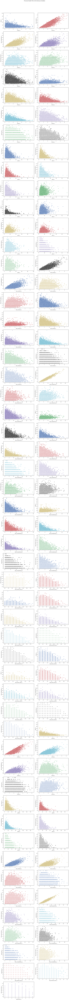

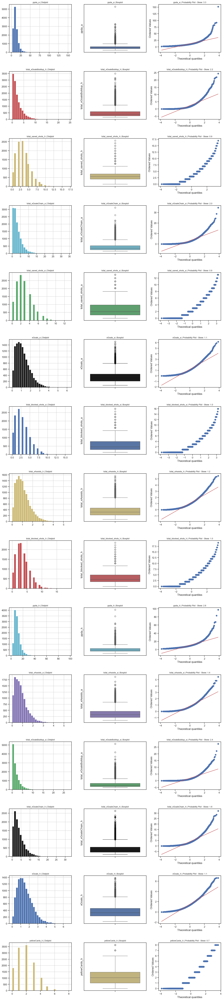

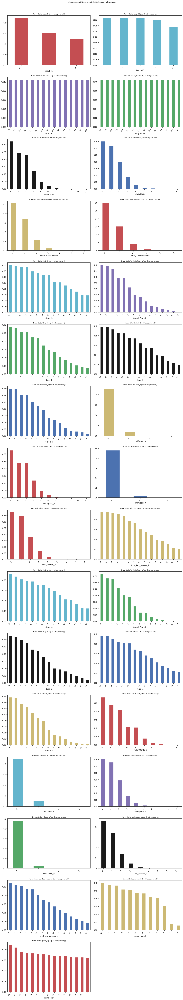

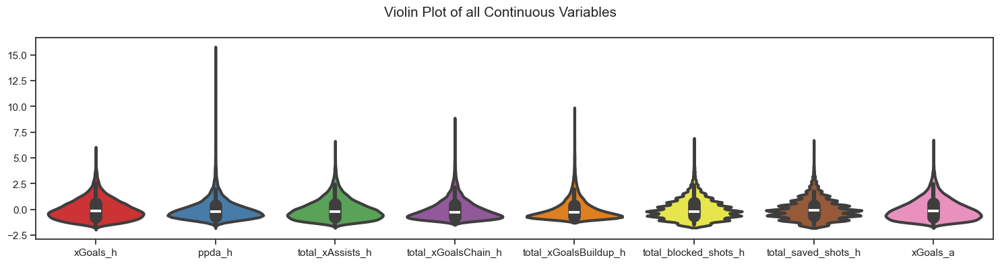

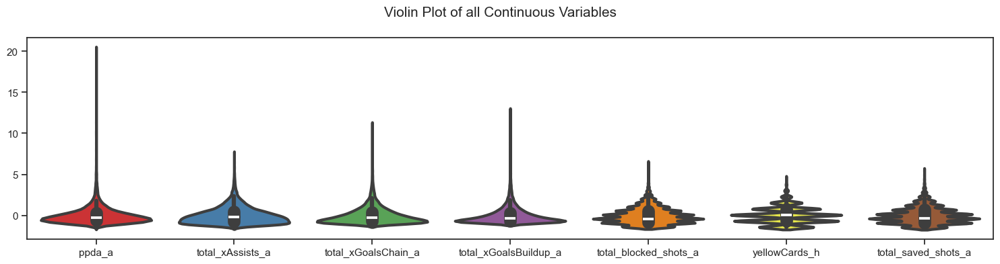

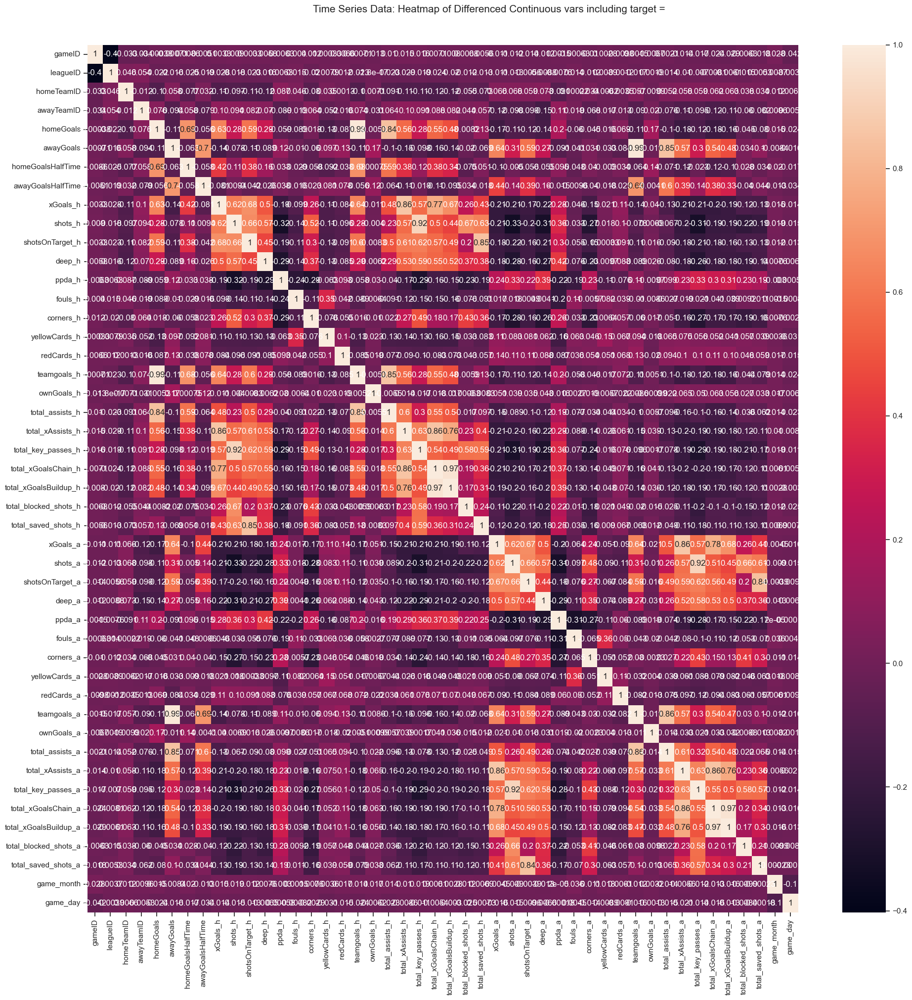

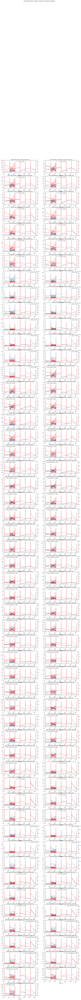

ValueError: Image size of 2000x116500 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 2000x116500 with 465 Axes>

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     C:\Users\eitanb\AppData\Roaming\nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     C:\Users\eitanb\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     C:\Users\eitanb\AppData\Roaming\nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     C:\Users\eitanb\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     C:\Users\eitanb\AppData\Roaming\nltk_data...
[nltk_data]    |   Unzipping corpora\inaugural.zip.
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    | 

Could not draw wordcloud plot for date. We need at least 1 word to plot a word cloud, got 0.
All Plots done
Time to run AutoViz = 150 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,gameID,leagueID,season,date,homeTeamID,awayTeamID,homeGoals,awayGoals,homeGoalsHalfTime,awayGoalsHalfTime,xGoals_h,shots_h,shotsOnTarget_h,deep_h,ppda_h,fouls_h,corners_h,yellowCards_h,redCards_h,teamgoals_h,ownGoals_h,total_assists_h,total_xAssists_h,total_key_passes_h,total_xGoalsChain_h,total_xGoalsBuildup_h,total_blocked_shots_h,total_saved_shots_h,xGoals_a,shots_a,shotsOnTarget_a,deep_a,ppda_a,fouls_a,corners_a,yellowCards_a,redCards_a,teamgoals_a,ownGoals_a,total_assists_a,total_xAssists_a,total_key_passes_a,total_xGoalsChain_a,total_xGoalsBuildup_a,total_blocked_shots_a,total_saved_shots_a,result_h,game_year,game_month,game_day
0,81,1,2015,8/8/2015 15:45,89,82,1,0,1,0,0.627539,9,1,4,13.8261,12,1,2.0,0,0,0,0,0.284979,5,1.396328,0.994160,4.0,1.0,0.674600,9,4,10,8.2188,12,2,3,0,0,1,0,0.586365,7,1.745371,0.811549,3.0,4.0,W,2015,8,8
1,82,1,2015,8/8/2015 18:00,73,71,0,1,0,0,0.876106,11,2,11,6.9000,13,6,3.0,0,0,0,0,0.419975,9,2.159510,1.170894,2.0,2.0,0.782253,7,3,2,11.8462,13,3,4,0,1,0,1,0.560695,4,1.238205,0.736815,2.0,2.0,L,2015,8,8
2,83,1,2015,8/8/2015 18:00,72,90,2,2,0,1,0.604226,10,5,5,6.6500,7,8,1.0,0,2,0,2,0.549139,8,1.025550,0.493522,2.0,3.0,0.557892,11,5,4,17.1579,13,2,2,0,2,0,1,0.418385,8,1.959323,1.030588,3.0,3.0,D,2015,8,8
3,84,1,2015,8/8/2015 18:00,75,77,4,2,3,0,2.568030,19,8,5,10.8800,13,6,2.0,0,4,0,2,1.727543,18,6.815649,3.741916,4.0,4.0,1.459460,11,5,6,9.5556,17,3,4,0,2,0,2,1.288886,9,7.622863,5.617276,2.0,3.0,W,2015,8,8
4,85,1,2015,8/8/2015 18:00,79,78,1,3,0,1,1.130760,17,6,5,5.7368,14,1,1.0,0,1,0,1,0.416638,12,1.966623,0.699249,3.0,4.0,2.109750,11,7,10,10.6250,20,4,0,0,3,0,3,2.050685,10,10.799517,8.554974,2.0,4.0,L,2015,8,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12675,16131,5,2020,5/23/2021 19:00,168,166,1,2,1,1,1.411190,15,5,17,12.3684,8,9,2.0,0,1,0,1,0.971853,11,3.853730,1.999150,6.0,4.0,1.707510,8,5,3,8.3529,11,5,2,0,2,0,1,0.307960,4,1.223212,0.715843,1.0,3.0,L,2021,5,23
12676,16132,5,2020,5/23/2021 19:00,177,176,1,2,1,1,1.198190,10,3,3,16.2632,11,5,1.0,0,1,0,1,0.855524,8,1.962812,1.028432,3.0,2.0,1.238050,12,5,4,27.0000,6,2,1,0,2,0,1,0.775388,7,2.610665,1.758012,4.0,3.0,L,2021,5,23
12677,16133,5,2020,5/23/2021 19:00,163,235,2,0,1,0,1.332690,12,6,10,8.2857,11,4,1.0,0,2,0,1,1.151649,8,7.684589,5.704923,2.0,4.0,0.357583,9,2,0,39.7273,10,3,0,0,0,0,0,0.216965,6,0.884652,0.544502,0.0,2.0,W,2021,5,23
12678,16134,5,2020,5/23/2021 19:00,175,181,0,1,0,1,1.460500,19,5,6,7.5600,13,9,1.0,0,0,0,0,1.265829,13,4.790546,3.092978,5.0,5.0,1.380290,10,2,3,14.7200,10,3,0,0,1,0,1,0.565077,6,1.256511,0.764512,1.0,1.0,L,2021,5,23


In [8]:
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

AV = AutoViz_Class()
AV.AutoViz(df)

In [7]:

df.describe()

,gameID,leagueID,season,homeTeamID,awayTeamID,homeGoals,awayGoals,homeGoalsHalfTime,awayGoalsHalfTime,xGoals_h,shots_h,shotsOnTarget_h,deep_h,ppda_h,fouls_h,corners_h,yellowCards_h,redCards_h,teamgoals_h,ownGoals_h,total_assists_h,total_xAssists_h,total_key_passes_h,total_xGoalsChain_h,total_xGoalsBuildup_h,total_blocked_shots_h,total_saved_shots_h,xGoals_a,shots_a,shotsOnTarget_a,deep_a,ppda_a,fouls_a,corners_a,yellowCards_a,redCards_a,teamgoals_a,ownGoals_a,total_assists_a,total_xAssists_a,total_key_passes_a,total_xGoalsChain_a,total_xGoalsBuildup_a,total_blocked_shots_a,total_saved_shots_a,game_year,game_month,game_day
count,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12679.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12677.000000,12677.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.00000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12672.000000,12672.000000,12680.000000,12680.000000,12680.000000
mean,7877.707334,2.983912,2016.984148,135.324842,135.333517,1.533202,1.206625,0.674054,0.526262,1.502215,13.706782,4.742350,6.424132,10.495906,12.796136,5.487618,1.922470,0.089984,1.488013,0.034858,1.035489,1.060799,10.126025,3.977122,2.334217,3.471799,3.258579,1.178646,11.216719,3.892587,5.216798,11.835520,13.114984,4.467823,2.142035,0.116404,1.171057,0.04511,0.824448,0.844537,8.336909,3.190858,1.882442,2.839331,2.721907,2017.510962,6.491325,16.019006
std,4753.774045,1.437191,2.000075,42.757999,42.767761,1.306732,1.167718,0.830917,0.734664,0.891745,5.264559,2.578636,4.276387,5.609321,4.152450,2.955970,1.352601,0.303297,1.287952,0.186413,1.079388,0.702824,4.357502,3.268582,2.309113,2.348723,2.142751,0.776568,4.656769,2.281611,3.713931,6.925258,4.249684,2.603438,1.374253,0.340057,1.149863,0.21132,0.965254,0.617374,3.846846,2.843056,2.003191,2.084720,1.885106,2.068747,3.847936,8.810537
min,81.000000,1.000000,2014.000000,71.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.897400,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.122000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2014.000000,1.000000,1.000000
25%,3812.750000,2.000000,2015.000000,101.000000,101.000000,1.000000,0.000000,0.000000,0.000000,0.836919,10.000000,3.000000,3.000000,6.814800,10.000000,3.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.539598,7.000000,1.640195,0.748686,2.000000,2.000000,0.593479,8.000000,2.000000,3.000000,7.483625,10.000000,3.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.381555,6.000000,1.171229,0.530240,1.000000,1.000000,2016.000000,3.000000,8.000000
50%,7981.500000,3.000000,2017.000000,132.000000,132.000000,1.000000,1.000000,0.000000,0.000000,1.343710,13.000000,4.000000,6.000000,9.250000,13.000000,5.000000,2.000000,0.000000,1.000000,0.000000,1.000000,0.925869,10.000000,3.092461,1.597885,3.000000,3.000000,1.032105,11.000000,4.000000,4.000000,10.229700,13.000000,4.000000,2.000000,0.000000,1.000000,0.00000,1.000000,0.714704,8.000000,2.380038,1.229509,2.000000,2.000000,2017.000000,6.000000,17.000000
75%,12023.250000,4.000000,2019.000000,163.000000,163.000000,2.000000,2.000000,1.000000,1.000000,2.007617,17.000000,6.000000,9.000000,12.613525,15.000000,7.000000,3.000000,0.000000,2.000000,0.000000,2.000000,1.425774,13.000000,5.382086,3.166327,5.000000,4.000000,1.597970,14.000000,5.000000,7.000000,14.190950,16.000000,6.000000,3.000000,0.000000,2.000000,0.00000,1.000000,1.145983,11.000000,4.365387,2.547429,4.000000,4.000000,2019.000000,10.000000,23.000000
max,16135.000000,5.000000,2020.0000

In [35]:
df.iloc[:,:30].describe()

,gameID,homeTeamID,awayTeamID,homeGoals,awayGoals,homeGoalsHalfTime,awayGoalsHalfTime,xGoals_h,shots_h,shotsOnTarget_h,deep_h,ppda_h,fouls_h,corners_h,yellowCards_h,redCards_h,teamgoals_h,ownGoals_h,total_assists_h,total_xAssists_h,total_key_passes_h,total_xGoalsChain_h,total_xGoalsBuildup_h,total_blocked_shots_h,total_saved_shots_h,xGoals_a,shots_a
count,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12679.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12677.000000,12677.000000,12680.000000,12680.000000
mean,7877.707334,135.324842,135.333517,1.533202,1.206625,0.674054,0.526262,1.502215,13.706782,4.742350,6.424132,10.495906,12.796136,5.487618,1.922470,0.089984,1.488013,0.034858,1.035489,1.060799,10.126025,3.977122,2.334217,3.471799,3.258579,1.178646,11.216719
std,4753.774045,42.757999,42.767761,1.306732,1.167718,0.830917,0.734664,0.891745,5.264559,2.578636,4.276387,5.609321,4.152450,2.955970,1.352601,0.303297,1.287952,0.186413,1.079388,0.702824,4.357502,3.268582,2.309113,2.348723,2.142751,0.776568,4.656769
min,81.000000,71.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.897400,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3812.750000,101.000000,101.000000,1.000000,0.000000,0.000000,0.000000,0.836919,10.000000,3.000000,3.000000,6.814800,10.000000,3.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.539598,7.000000,1.640195,0.748686,2.000000,2.000000,0.593479,8.000000
50%,7981.500000,132.000000,132.000000,1.000000,1.000000,0.000000,0.000000,1.343710,13.000000,4.000000,6.000000,9.250000,13.000000,5.000000,2.000000,0.000000,1.000000,0.000000,1.000000,0.925869,10.000000,3.092461,1.597885,3.000000,3.000000,1.032105,11.000000
75%,12023.250000,163.000000,163.000000,2.000000,2.000000,1.000000,1.000000,2.007617,17.000000,6.000000,9.000000,12.613525,15.000000,7.000000,3.000000,0.000000,2.000000,0.000000,2.000000,1.425774,13.000000,5.382086,3.166327,5.000000,4.000000,1.597970,14.000000
max,16135.000000,262.000000,262.000000,10.000000,9.000000,6.000000,5.000000,6.630490,47.000000,18.000000,42.000000,97.333300,33.000000,20.000000,8.000000,3.000000,10.000000,2.000000,8.000000,5.512622,38.000000,32.011994,24.437683,19.000000,17.000000,6.186960,39.000000


In [36]:
df.iloc[:,30:60].describe()

,shotsOnTarget_a,deep_a,ppda_a,fouls_a,corners_a,yellowCards_a,redCards_a,teamgoals_a,ownGoals_a,total_assists_a,total_xAssists_a,total_key_passes_a,total_xGoalsChain_a,total_xGoalsBuildup_a,total_blocked_shots_a,total_saved_shots_a
count,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12680.00000,12680.000000,12680.000000,12680.000000,12680.000000,12680.000000,12672.000000,12672.000000
mean,3.892587,5.216798,11.835520,13.114984,4.467823,2.142035,0.116404,1.171057,0.04511,0.824448,0.844537,8.336909,3.190858,1.882442,2.839331,2.721907
std,2.281611,3.713931,6.925258,4.249684,2.603438,1.374253,0.340057,1.149863,0.21132,0.965254,0.617374,3.846846,2.843056,2.003191,2.084720,1.885106
min,0.000000,0.000000,2.122000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,3.000000,7.483625,10.000000,3.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.381555,6.000000,1.171229,0.530240,1.000000,1.000000
50%,4.000000,4.000000,10.229700,13.000000,4.000000,2.000000,0.000000,1.000000,0.00000,1.000000,0.714704,8.000000,2.380038,1.229509,2.000000,2.000000
75%,5.000000,7.000000,14.190950,16.000000,6.000000,3.000000,0.000000,2.000000,0.00000,1.000000,1.145983,11.000000,4.365387,2.547429,4.000000,4.000000
max,15.000000,28.000000,152.000000,32.000000,19.000000,9.000000,3.000000,9.000000,3.00000,8.000000,5.463750,27.000000,34.587459,27.419105,16.000000,13.000000


In [37]:
categorical_df.describe()

,leagueID,season,result_h,game_year,game_month,game_day
count,12680,12680,12680,12680,12680,12680
unique,5,7,3,8,12,31
top,1,2014,W,2017,12,20
freq,2660,1826,5654,1877,1527,567


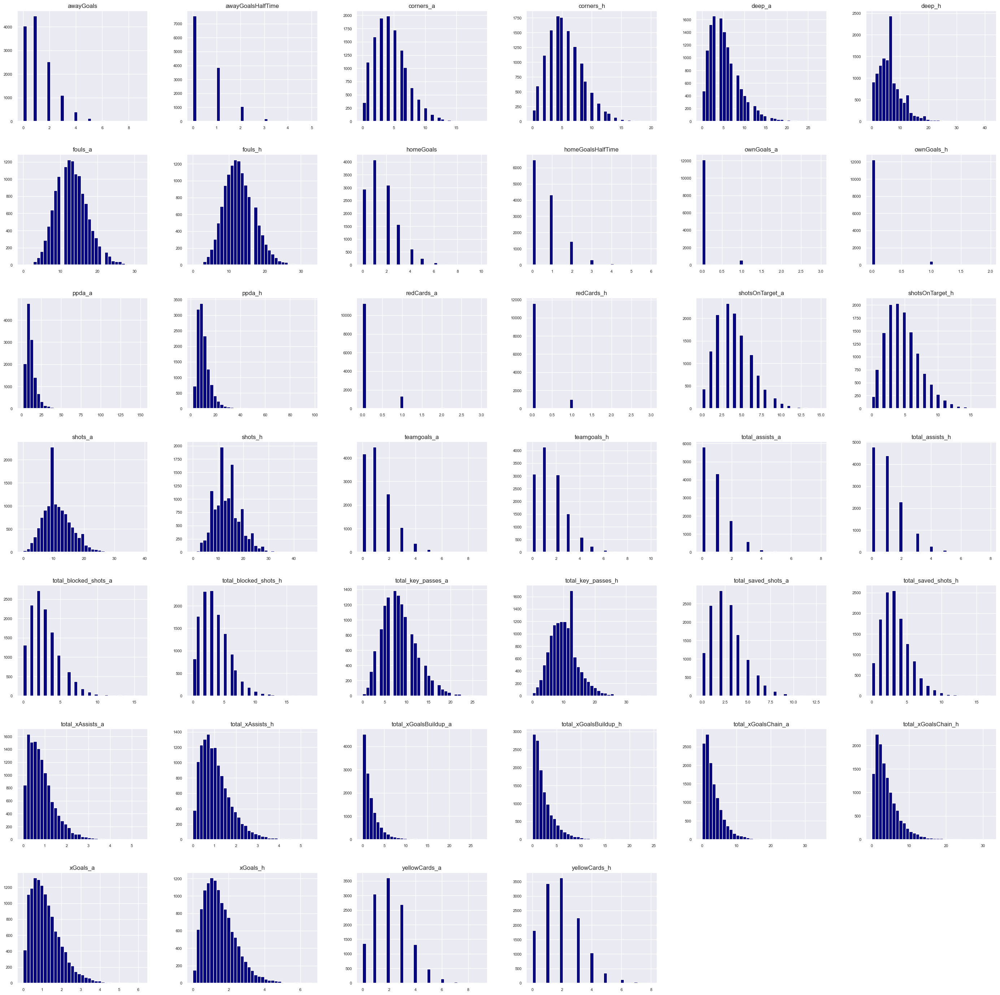

In [63]:
df[df_num].hist(figsize=(35, 35), bins=35, xlabelsize=8, ylabelsize=8, color = "navy");
plt.show()

In [64]:
def highlight(cell_value):
    highlight = 'background-color: mediumspringgreen;'
    default = ''
    negative = 'background-color: hotpink;'
    if cell_value > 1:
        return highlight
    elif cell_value < -1:
        return negative
    #else
       # return default  
pd.DataFrame(df[df_num].skew(),columns=['skewness']).sort_values(by='skewness', ascending=False).style.applymap(highlight)

,skewness
ownGoals_h,5.326258
ownGoals_a,4.682871
redCards_h,3.412354
ppda_a,3.277596
redCards_a,2.880568
ppda_h,2.602424
total_xGoalsBuildup_a,2.408524
total_xGoalsBuildup_h,2.191562
total_xGoalsChain_a,1.972202
total_xGoalsChain_h,1.819149


In [67]:
def highlight(cell_value):
    highlight = 'background-color: mediumspringgreen;'
    default = ''
    negative = 'background-color: hotpink;'
    if cell_value > 4:
        return highlight
    elif cell_value < 2:
        return negative
    else:
        return default
    
  

# Calculate kurtosis
#kurtosis_df = df[df_num].kurt().to_frame(name="Kurtosis")

pd.DataFrame(df[df_num].kurt(),columns=['Kurtosis']).sort_values(by='Kurtosis', ascending=False).style.applymap(highlight)

,Kurtosis
ownGoals_h,28.089588
ppda_a,27.872046
ownGoals_a,22.321458
ppda_h,15.802852
redCards_h,11.743004
total_xGoalsBuildup_a,9.678273
redCards_a,7.950316
total_xGoalsBuildup_h,7.510977
total_xGoalsChain_a,6.401820
total_xGoalsChain_h,5.227653


#### most of my data is skewed the result from skewness and Kurtosis showed that  only 5 columns are close to Normal distribution(Kurtosis=3), 10 are The distribution has heavier tails than normal (Kurtosis>3) and all the rest are The distribution has lighter tails than normal (Kurtosis<3). we will see the outliers checks later

In [ ]:
all of the columns are positive skewed (skewness > 0) 20 of them with right tail (skewness > 1)

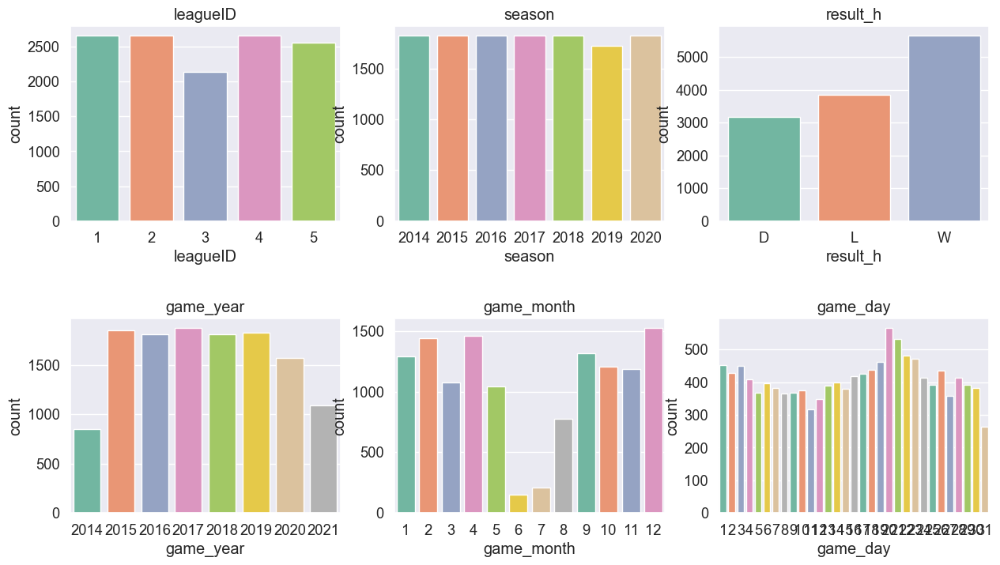

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# Define number of rows and columns dynamically based on data
num_plots = len(categorical_df.columns)
rows = math.ceil(num_plots / b)  # Adjust rows dynamically

# Choose a color palette
palette_choice = "Set2"  

# Create figure
fig = plt.figure(figsize=(b * 5, rows * 4))  # Scale size dynamically
plt.subplots_adjust(hspace=0.5)
sns.set(font_scale=1.2)  

# Loop through categorical columns and plot
for i, col in enumerate(categorical_df.columns, 1):  
    plt.subplot(rows, b, i)
    plt.title(col)
    
    # Count plot with color palette
    sns.countplot(x=col, data=categorical_df, palette=palette_choice)  

plt.show()


### Distribution of the target variable

In [77]:
df['result_h'].value_counts()

result_h
W    5654
L    3854
D    3172
Name: count, dtype: int64

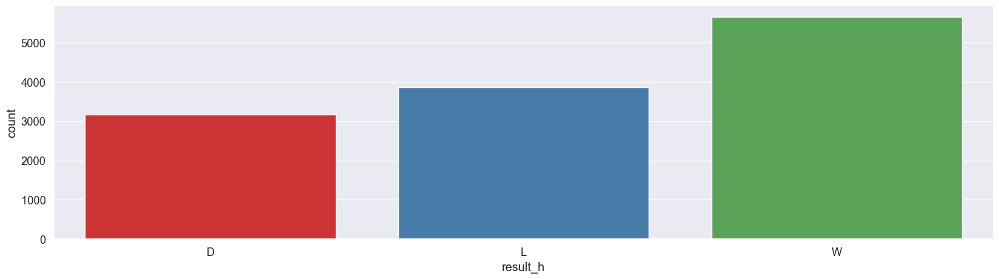

In [81]:
#fig, ax = plt.subplots(figsize=(20,5))
sns.countplot(x=df['result_h'].dropna(),data=df, palette="Set1")
plt.show()

#### most of the target results are for wining by the home team

## Correlation

### we will use spearman correlation since our data is not normal distribution

In [92]:
df.columns

Index(['gameID', 'leagueID', 'season', 'date', 'homeTeamID', 'awayTeamID',
       'homeGoals', 'awayGoals', 'homeGoalsHalfTime', 'awayGoalsHalfTime',
       'xGoals_h', 'shots_h', 'shotsOnTarget_h', 'deep_h', 'ppda_h', 'fouls_h',
       'corners_h', 'yellowCards_h', 'redCards_h', 'teamgoals_h', 'ownGoals_h',
       'total_assists_h', 'total_xAssists_h', 'total_key_passes_h',
       'total_xGoalsChain_h', 'total_xGoalsBuildup_h', 'total_blocked_shots_h',
       'total_saved_shots_h', 'xGoals_a', 'shots_a', 'shotsOnTarget_a',
       'deep_a', 'ppda_a', 'fouls_a', 'corners_a', 'yellowCards_a',
       'redCards_a', 'teamgoals_a', 'ownGoals_a', 'total_assists_a',
       'total_xAssists_a', 'total_key_passes_a', 'total_xGoalsChain_a',
       'total_xGoalsBuildup_a', 'total_blocked_shots_a', 'total_saved_shots_a',
       'result_h', 'game_year', 'game_month', 'game_day', 'result'],
      dtype='object')

In [95]:
df_base=df.drop(columns=['gameID','homeTeamID', 'awayTeamID','date'])
df_base['result_h'] = df_base['result_h'].map({'W': 2, 'D': 1, 'L': 0})

In [96]:
corr = df_base.corr(method = 'spearman')
corr.style.background_gradient(cmap='coolwarm')

,leagueID,season,homeGoals,awayGoals,homeGoalsHalfTime,awayGoalsHalfTime,xGoals_h,shots_h,shotsOnTarget_h,deep_h,ppda_h,fouls_h,corners_h,yellowCards_h,redCards_h,teamgoals_h,ownGoals_h,total_assists_h,total_xAssists_h,total_key_passes_h,total_xGoalsChain_h,total_xGoalsBuildup_h,total_blocked_shots_h,total_saved_shots_h,xGoals_a,shots_a,shotsOnTarget_a,deep_a,ppda_a,fouls_a,corners_a,yellowCards_a,redCards_a,teamgoals_a,ownGoals_a,total_assists_a,total_xAssists_a,total_key_passes_a,total_xGoalsChain_a,total_xGoalsBuildup_a,total_blocked_shots_a,total_saved_shots_a,result_h,game_year,game_month,game_day,result
leagueID,1.000000,-0.011189,-0.011436,-0.033221,-0.012514,-0.024377,-0.025624,-0.065502,-0.023131,-0.131457,-0.076538,0.162998,-0.052350,0.058865,0.050574,-0.009006,-0.006139,-0.013915,-0.034818,-0.071499,-0.039628,-0.041025,-0.120499,-0.015154,-0.059968,-0.079133,-0.040358,-0.155058,-0.046172,0.156793,-0.075183,0.071430,0.047800,-0.032957,-0.014395,-0.030539,-0.060006,-0.081923,-0.067048,-0.066615,-0.121602,-0.019874,0.014447,-0.010301,-0.029395,-0.004534,0.014447
season,-0.011189,1.000000,-0.003730,0.050618,-0.014749,0.035981,0.015879,-0.045656,-0.023462,0.021069,0.189531,-0.077293,-0.057595,0.002181,-0.027561,-0.001823,0.002053,-0.010384,0.000058,-0.039847,0.042453,0.053503,-0.010059,-0.024474,0.089045,0.011487,0.018133,0.070025,0.157211,-0.126810,0.006746,-0.038300,-0.032324,0.051560,-0.005361,0.033963,0.067364,0.005013,0.092732,0.095643,0.032069,-0.005141,-0.034049,0.972616,0.012522,-0.006014,-0.034049
homeGoals,-0.011436,-0.003730,1.000000,-0.075874,0.658365,-0.031795,0.608347,0.264244,0.566983,0.244392,-0.016869,-0.076529,0.012084,-0.110358,-0.078921,0.984822,-0.006915,0.821408,0.524452,0.265327,0.502133,0.436624,-0.005759,0.108625,-0.133065,-0.075582,-0.095580,-0.098196,0.124819,-0.038290,-0.022524,-0.002762,0.078895,-0.074971,0.161138,-0.083797,-0.148038,-0.090315,-0.153945,-0.134761,-0.022438,-0.069618,0.684398,0.001170,-0.003166,-0.009543,0.684398
awayGoals,-0.033221,0.050618,-0.075874,1.000000,-0.034998,0.665542,-0.124532,-0.062635,-0.093423,-0.064400,0.081781,0.007621,-0.042092,0.094092,0.119724,-0.074681,0.166127,-0.076967,-0.144809,-0.082397,-0.148832,-0.130675,0.002203,-0.066179,0.606813,0.301792,0.563273,0.250748,-0.053056,-0.020160,0.036902,-0.015331,-0.065490,0.984943,-0.009582,0.826960,0.519682,0.288618,0.497257,0.428352,0.038495,0.098243,-0.642559,0.049534,0.008421,-0.008641,-0.642559
homeGoalsHalfTime,-0.012514,-0.014749,0.658365,-0.034998,1.000000,-0.034418,0.384339,0.094571,0.347701,0.113474,0.078865,-0.028519,-0.061367,-0.078678,-0.034297,0.646465,0.008058,0.553991,0.342967,0.104662,0.335959,0.291998,-0.065756,0.037200,-0.060373,0.024601,-0.029802,-0.012637,0.015049,-0.031166,0.055099,0.000536,0.036997,-0.035991,0.126222,-0.052697,-0.081793,0.005640,-0.091736,-0.075297,0.042827,-0.014708,0.435125,-0.011418,0.000738,-0.010568,0.435125
awayGoalsHalfTime,-0.024377,0.035981,-0.031795,0.665542,-0.034418,1.000000,-0.067653,0.020847,-0.028309,-0.000579,-0.009549,-0.004332,0.034687,0.074368,0.076753,-0.030514,0.114997,-0.040397,-0.090912,-0.003695,-0.094924,-0.076459,0.048534,-0.014952,0.402162,0.133999,0.362111,0.131121,0.030521,-0.003575,-0.037495,-0.007396,-0.019710,0.656363,-0.003704,0.556684,0.342887,0.131941,0.336698,0.286618,-0.033448,0.041945,-0.413768,0.035612,0.004352,-0.019144,-0.413768
xGoals_h,-0.025624,0.015879,0.608347,-0.124532,0.384339,-0.067653,1.000000,0.616286,0.660090,0.475620,-0.176584,-0.094158,0.254129,-0.100449,-0.098981,0.611872,-0.025326,0.452101,0.839731,0.570459,0.763594,0.660706,0.265155,0.416632,-0.191813,-0.194928,-0.159565,-0.200643,0.256575,-0.036370,-0.148225,0.034957,0.105635,-0.121161,0.032615,-0.116247,-0.192328,-0.189961,-0.197390,-0.186312,-0.109320,-0.121918,0.453233,0.020103,-0.004241,-0.017398,0.453233
shots_h,-0.065502,-0.045656,0.264244,-0.062635,0.094571,0.020847,0.616286,1.000000,0.642636,0.553946,-0.315042,-0.131675,0.502022,-0.108091,-0.103266,0.266355,-0.0

In [105]:

# Perform ANOVA for each numeric column
anova_results = {}
for col in df_num:
    groups = [df[col][df["result_h"] == category] for category in df["result_h"].unique()]
    f_stat, p_value = stats.f_oneway(*groups)
    anova_results[col] = {"F-statistic": f_stat, "p-value": p_value}

# Convert results to DataFrame and display
anova_df = pd.DataFrame(anova_results).T
anova_df

,F-statistic,p-value
awayGoals,4793.049454,0.000000e+00
awayGoalsHalfTime,1527.715117,0.000000e+00
corners_a,4.201841,1.498885e-02
corners_h,11.314631,1.231682e-05
deep_a,333.402726,7.667187e-142
deep_h,224.149257,2.162351e-96
fouls_a,29.250573,2.117674e-13
fouls_h,22.570886,1.640591e-10
homeGoals,4763.547424,0.000000e+00
homeGoalsHalfTime,1462.376582,0.000000e+00


In [ ]:
homeTeamID, awayTeamID, season are significant  

<Figure size 800x500 with 0 Axes>

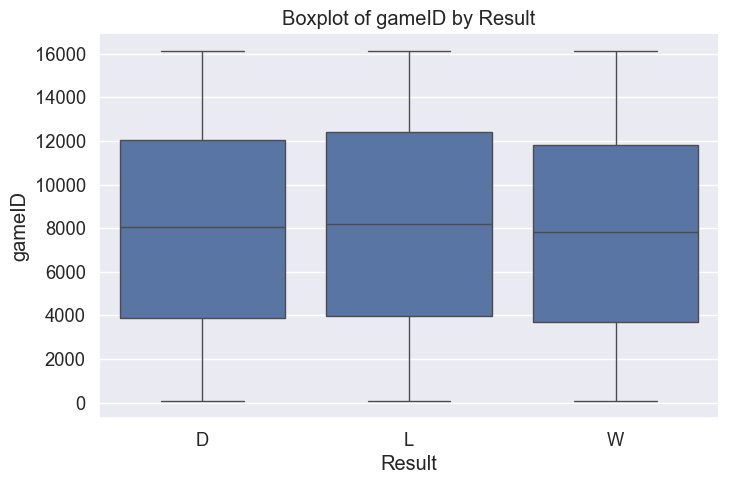

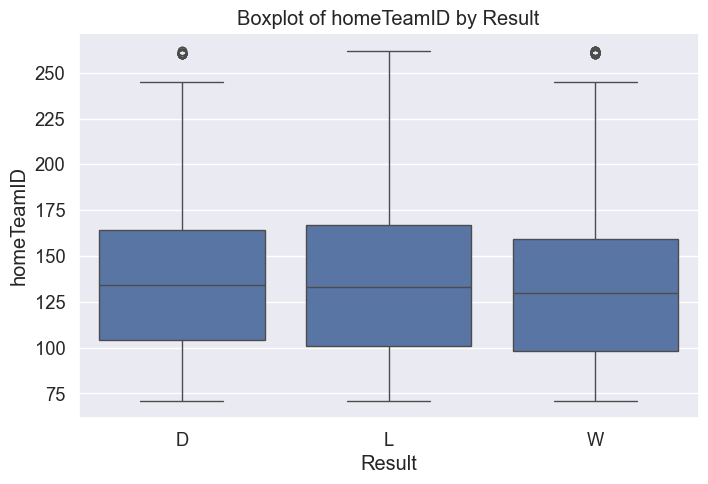

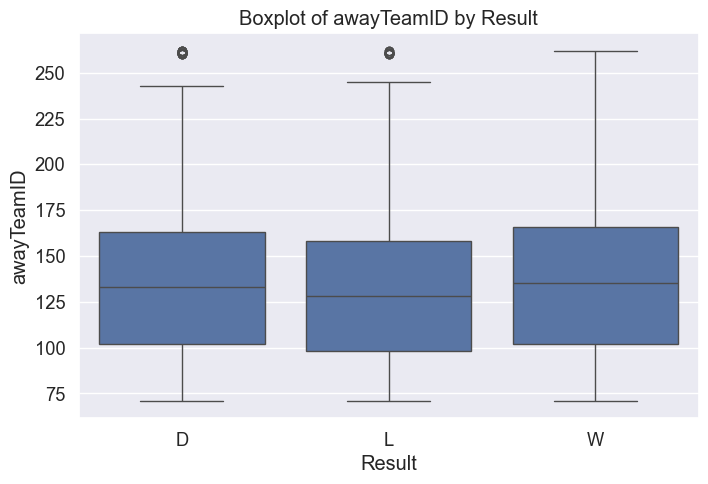

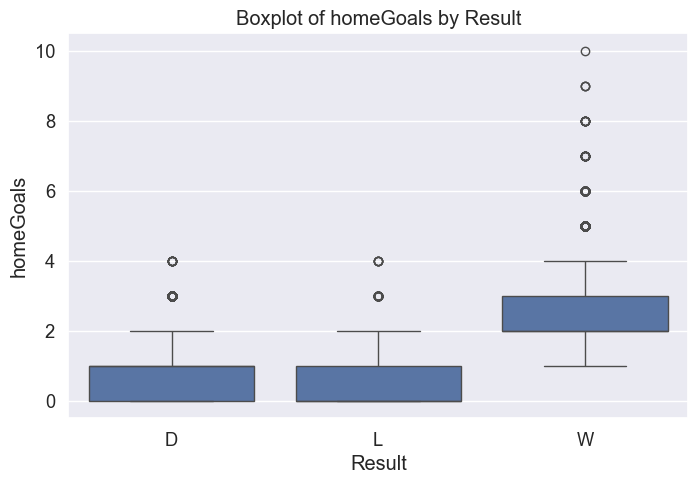

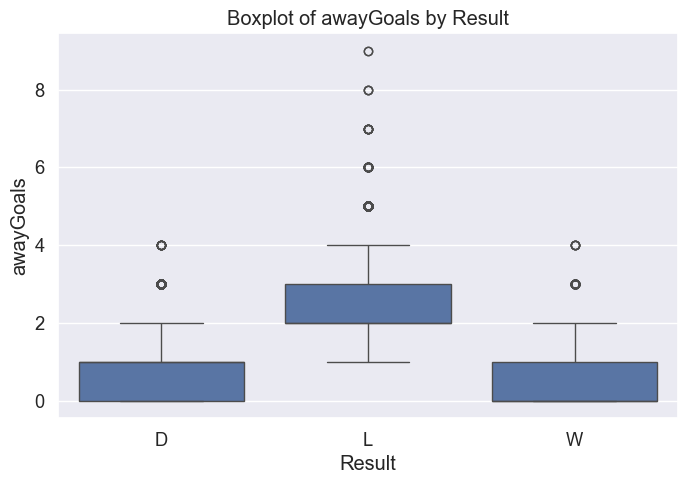

...

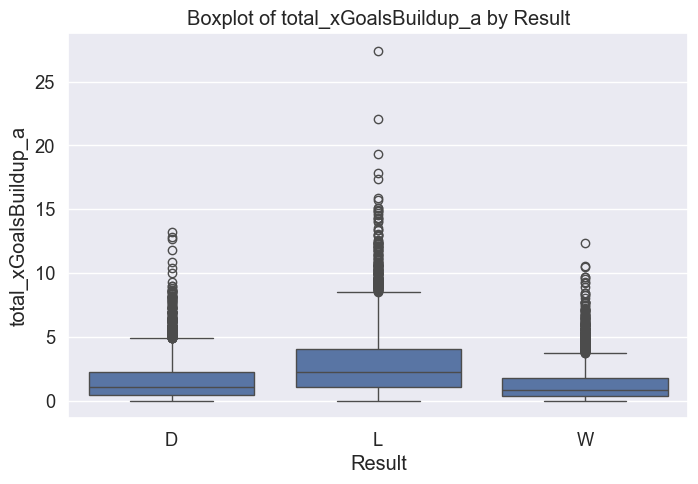

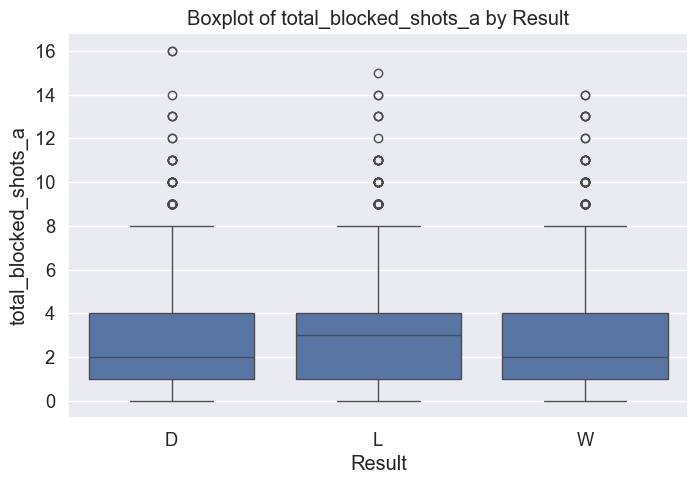

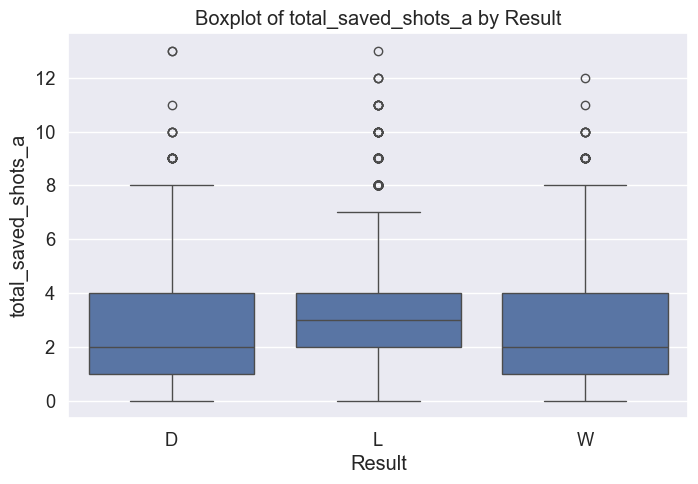

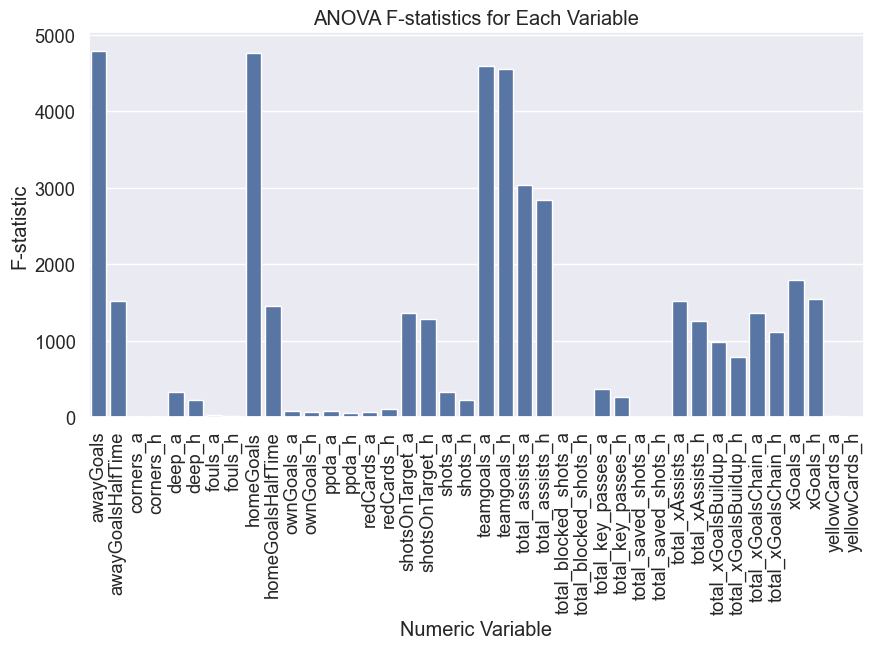

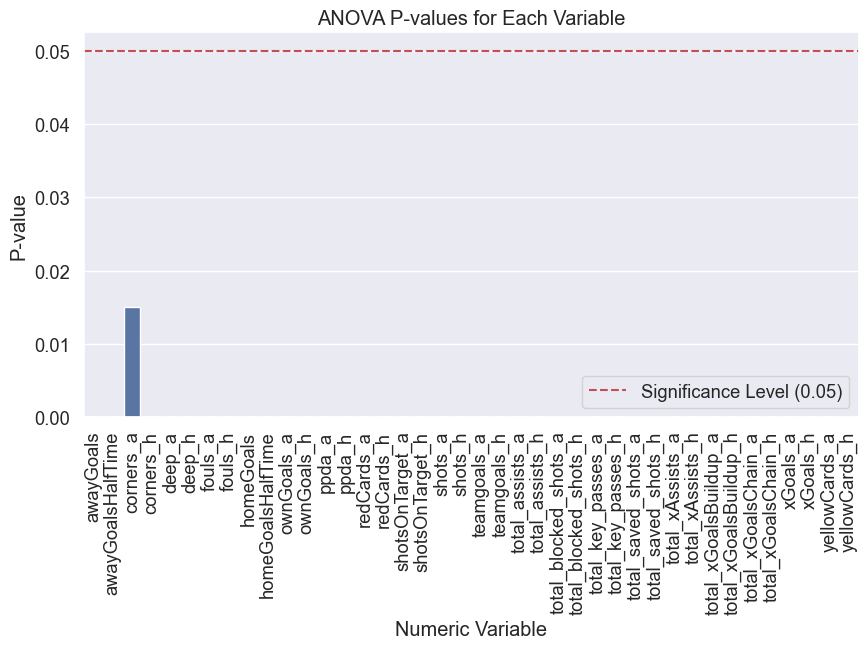

In [104]:
# Plot boxplots for each numeric column
for col in df_num:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x="result_h", y=col, data=df)
    plt.title(f"Boxplot of {col} by Result")
    plt.xlabel("Result")
    plt.ylabel(col)
    plt.show()

# Bar plot of F-statistics
plt.figure(figsize=(10, 5))
sns.barplot(x=anova_df.index, y=anova_df["F-statistic"])
plt.xticks(rotation=90)
plt.title("ANOVA F-statistics for Each Variable")
plt.xlabel("Numeric Variable")
plt.ylabel("F-statistic")
plt.show()

# Bar plot of p-values
plt.figure(figsize=(10, 5))
sns.barplot(x=anova_df.index, y=anova_df["p-value"])
plt.xticks(rotation=90)
plt.axhline(y=0.05, color='r', linestyle='--', label="Significance Level (0.05)")
plt.title("ANOVA P-values for Each Variable")
plt.xlabel("Numeric Variable")
plt.ylabel("P-value")
plt.legend()
plt.show()

<Axes: >

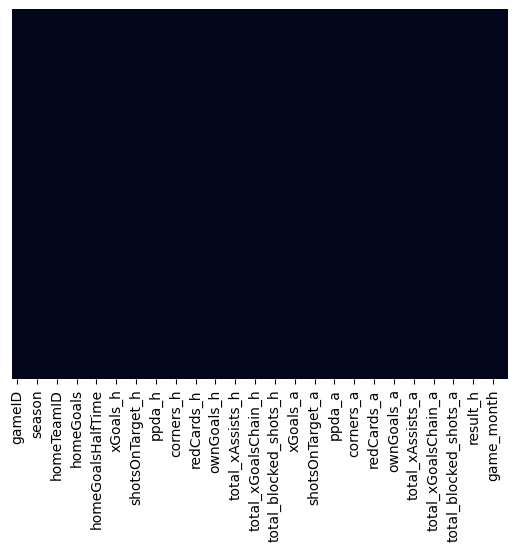

In [10]:
#missing values matrix by seaboran
sns.heatmap(df.isnull(), yticklabels=False, cbar=False)

Target Variable Distribution:

Home team wins (W): 44.6%
Home team losses (L): 30.4%
Draws (D): 25.0%
This suggests that home teams win more often than they lose or draw.
Missing Values:

A few features have missing values, including total_saved_shots_h/a, total_blocked_shots_h/a, and yellowCards_h, but the percentage of missing data is very low.
Statistical Summary:

The dataset contains match statistics related to goals, expected goals, shots, passes, and fouls for both home and away teams.
The average home goals scored is 1.53, while away goals average 1.21.
Expected goals (xGoals_h, xGoals_a) show a similar pattern.
Correlations:

homeGoals and xGoals_h have the strongest positive correlation with winning.
Defensive statistics like ppda_h (passes per defensive action) show a moderate correlation.
Fouls, corners, and red/yellow cards have low correlations with match results.
Visualizations:

Histograms show the distribution of key numerical features.
Boxplots highlight some potential outliers in shots, goals, and expected goals.
Time series trends suggest variations in match outcomes over time.

##### outliers analysis

In [13]:
# Identifying outliers using the IQR method

# Define numerical features for outlier detection
num_features = ['homeGoals', 'awayGoals', 'xGoals_h', 'xGoals_a', 'shots_h', 'shotsOnTarget_h', 'corners_h']

# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df[num_features].quantile(0.25)
Q3 = df[num_features].quantile(0.75)
IQR = Q3 - Q1

# Define outlier boundaries
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers = ((df[num_features] < lower_bound) | (df[num_features] > upper_bound)).sum()




In [14]:
outliers

homeGoals          981
awayGoals           44
xGoals_h           276
xGoals_a           312
shots_h            167
shotsOnTarget_h    351
corners_h          143
dtype: int64